# <center>CSCI 6516 - Machine Learning for Big Data</center><br><center>(Fall 2023)</center>

# <center>Assignment 2</center>

### Submitted by:
**Arihant Dugar**<br>
**B00917961**<br>
**ar968345@dal.ca**<br>

In [178]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats.mstats import winsorize
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import roc_auc_score, log_loss, roc_curve, auc
from sklearn.preprocessing import StandardScaler

#### [1] Your first task is doing some research on the dataset

In [2]:
heart_dataset = pd.read_csv('heart.csv')

In [3]:
heart_dataset.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,52,1,0,125,212,0,1,168,0,1.0,2,2,3,0
1,53,1,0,140,203,1,0,155,1,3.1,0,0,3,0
2,70,1,0,145,174,0,1,125,1,2.6,0,0,3,0
3,61,1,0,148,203,0,1,161,0,0.0,2,1,3,0
4,62,0,0,138,294,1,1,106,0,1.9,1,3,2,0


#### [a] Process or pre-process the heart disease data. Show the outputs of the pre-processing phase.  

In [4]:
print('\x1b[1;31m'+'Total Records :'+'\x1b[0m', len(heart_dataset))
print('\x1b[1;31m'+'Duplicate Records :'+'\x1b[0m', len(heart_dataset[heart_dataset.duplicated()]))
heart_dataset = heart_dataset.drop_duplicates()
print('\x1b[1;31m'+'Total Records after dropping duplicates :'+'\x1b[0m', len(heart_dataset))

Total Records : 1025
Duplicate Records : 723
Total Records after dropping duplicates : 302




Visual Analysis of data before pre-processing :




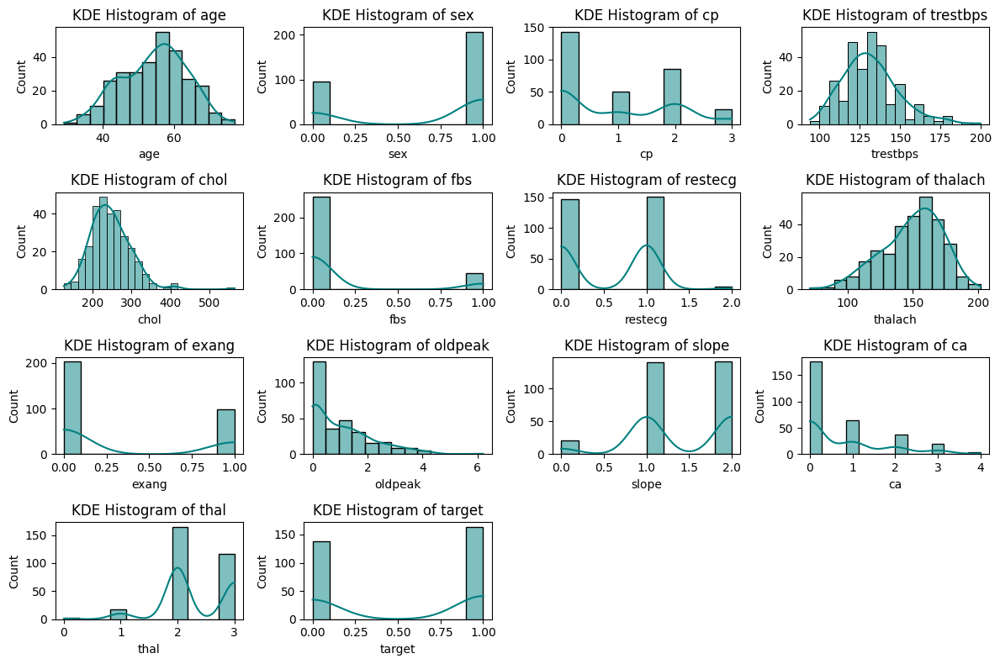

In [5]:
print('\n\n\x1b[1;31m'+'Visual Analysis of data before pre-processing :'+'\x1b[0m\n\n')

columns = 4  # Number of subplots per row
rows = (len(heart_dataset.columns) + columns - 1) // columns  
fig, axs = plt.subplots(rows, columns, figsize=(12, 8))
axs = axs.ravel()

for i, column in enumerate(heart_dataset.columns):
    sns.histplot(data=heart_dataset, x=column, color="teal", kde=True, ax=axs[i])
    axs[i].set_title(f'KDE Histogram of {column}')
    axs[i].set_xlabel(column)

# Hide any empty subplots
for i in range(len(heart_dataset.columns), len(axs)):
    axs[i].axis('off')

plt.tight_layout()
plt.show()



Visual Analysis of data before pre-processing :




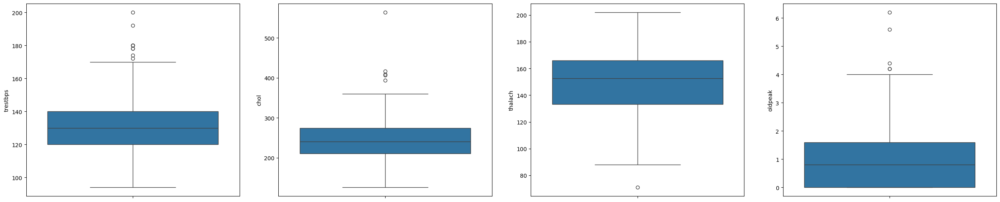

In [6]:
#Columns to consider for pre-processing
columns_to_consider = ['trestbps', 'chol', 'thalach', 'oldpeak']

print('\n\n\x1b[1;31m'+'Visual Analysis of data before pre-processing :'+'\x1b[0m\n\n')

plt.figure(figsize=(25,5))

for i, col in enumerate(columns_to_consider):
    plt.subplot(1,len(columns_to_consider),i+1)
    sns.boxplot(heart_dataset[col])
plt.tight_layout(pad=0.4, w_pad=3, h_pad=5)
plt.show()



Visual Analysis of data after removing outliers using winsorize :




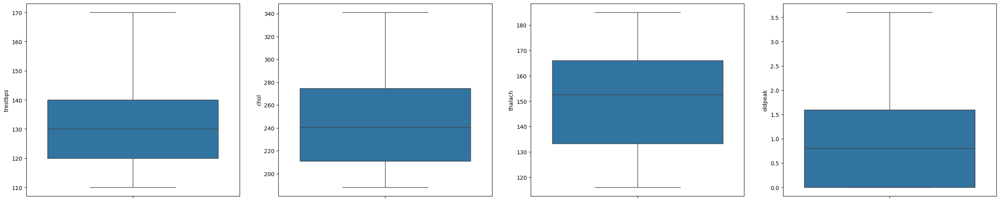

In [7]:
# Remove outliers using winsorizing
winsorized_data = heart_dataset.copy()
for column in columns_to_consider:
    winsorized_data.loc[:, column] = winsorize(winsorized_data[column], limits=[0.1, 0.03], inplace=True)

print('\n\n\x1b[1;31m'+'Visual Analysis of data after removing outliers using winsorize :'+'\x1b[0m\n\n')

plt.figure(figsize=(25,5))

for i, col in enumerate(columns_to_consider):
    plt.subplot(1,len(columns_to_consider),i+1)
    sns.boxplot(winsorized_data[col])
plt.tight_layout(pad=0.4, w_pad=3, h_pad=5)
plt.show()



Visual Analysis of data after removing outliers using IQR :




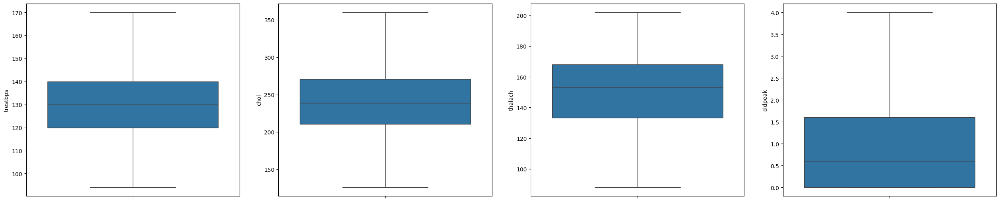

Total Records after dropping outliers using IQR : 283


In [166]:
# Removing outliers using Interquartile range (IQR)
heart_dataset_outlier_dropped = heart_dataset.copy()
for column in columns_to_consider:
    q1 = heart_dataset_outlier_dropped[column].quantile(0.25)
    q3 = heart_dataset_outlier_dropped[column].quantile(0.75)
    iqr = q3-q1
    lw_bound = q1 - 1.5*iqr
    up_bound = q3 + 1.5*iqr
    heart_dataset_outlier_dropped = heart_dataset_outlier_dropped[(heart_dataset_outlier_dropped[column] >= lw_bound) & (heart_dataset_outlier_dropped[column] <= up_bound)]

print('\n\n\x1b[1;31m'+'Visual Analysis of data after removing outliers using IQR :'+'\x1b[0m\n\n')

plt.figure(figsize=(25,5))

for i, col in enumerate(columns_to_consider):
    plt.subplot(1,len(columns_to_consider),i+1)
    sns.boxplot(heart_dataset_outlier_dropped[col])
plt.tight_layout(pad=0.4, w_pad=3, h_pad=5)
plt.show()

print('\x1b[1;31m'+'Total Records after dropping outliers using IQR :'+'\x1b[0m', len(heart_dataset_outlier_dropped))



Visual Analysis of data after performing log transformation :




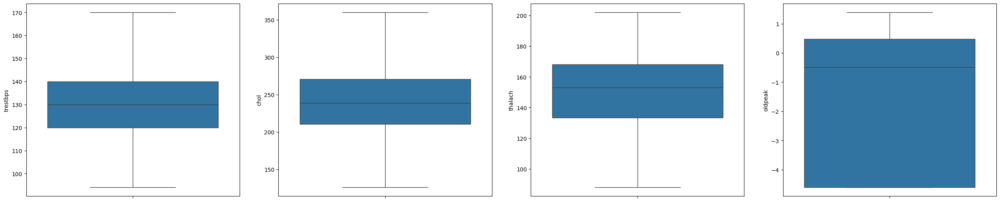

In [167]:
#Log Transformation

columns_to_perform = ['oldpeak']
heart_dataset_log_tranformed = heart_dataset_outlier_dropped.copy()

for column in columns_to_perform:
    heart_dataset_log_tranformed[column] = np.log(heart_dataset_log_tranformed[column]+0.01)

print('\n\n\x1b[1;31m'+'Visual Analysis of data after performing log transformation :'+'\x1b[0m\n\n')
plt.figure(figsize=(25,5))

for i, col in enumerate(columns_to_consider):
    plt.subplot(1,len(columns_to_consider),i+1)
    sns.boxplot(heart_dataset_log_tranformed[col])
plt.tight_layout(pad=0.4, w_pad=3, h_pad=5)
plt.show()

In [168]:
X = heart_dataset_log_tranformed.drop(columns=['target'])
y = heart_dataset_log_tranformed['target']


Feature scores:
     Feature      Score      P-values
8      exang  35.951638  2.022763e-09
2         cp  17.577310  2.758603e-05
11        ca  15.559000  7.997004e-05
9    oldpeak  10.668907  1.089515e-03
1        sex   8.644060  3.281294e-03
10     slope   3.780316  5.185885e-02
7    thalach   3.670549  5.538195e-02
6    restecg   2.096647  1.476225e-01
12      thal   1.858839  1.727589e-01
0        age   0.966739  3.254949e-01
3   trestbps   0.327279  5.672659e-01
4       chol   0.230504  6.311507e-01
5        fbs   0.179910  6.714505e-01


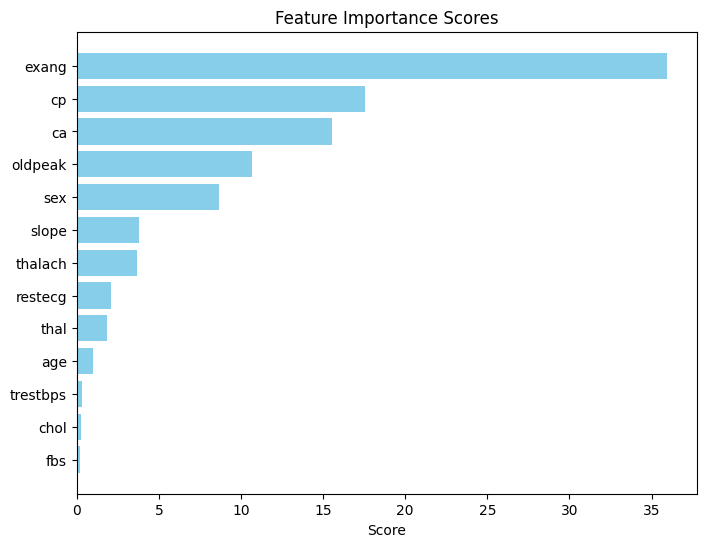

In [169]:
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)
scores, p_values = chi2(X_scaled, y)

# Display the scores of each feature
feature_scores_df = pd.DataFrame({'Feature': X.columns, 'Score': scores, 'P-values' : p_values })
feature_scores_df = feature_scores_df.sort_values(by='Score', ascending=False)
print("Feature scores:")
print(feature_scores_df)

# Create a horizontal bar plot
plt.figure(figsize=(8, 6))
plt.barh(feature_scores_df['Feature'], feature_scores_df['Score'], color='skyblue')
plt.xlabel('Score')
plt.title('Feature Importance Scores')
plt.gca().invert_yaxis()
plt.show()

Based on the hypothesis that the null hypothesis will be rejected if the Chi-Square value falls within the alpha error region (ranging from 0 to 0.05), the features with p-values less than 0.05 signify a statistically significant relationship with the target variable. In light of this:

Features with notably high Chi-Square scores and exceptionally low p-values are strong candidates for selection. Specifically, 'exang' with a Chi-Square score of 35.95 and a p-value of 2.02e-09, 'cp' with a score of 17.58 and a p-value of 2.76e-05, and 'ca' with a score of 15.56 and a p-value of 7.99e-05 exhibit both substantial association strength and high statistical significance. These features convincingly reject the null hypothesis and are prime selections for inclusion in the predictive model.

Subsequently, 'oldpeak' and 'sex' also exhibit moderate to high scores and p-values below the alpha threshold. While 'oldpeak' shows a score of 10.67 and a p-value of 1.09e-03, 'sex' demonstrates a score of 8.64 with a p-value of 3.28e-03. These features present reasonably strong associations with the target variable and could be considered for inclusion in the model.

Features such as 'slope', 'thalach', 'restecg', 'thal', 'age', 'trestbps', 'chol', and 'fbs' exhibit lower scores and p-values above the alpha level. Their weaker association and higher p-values suggest less statistical significance, indicating they might not strongly impact predictions and could be considered for exclusion from the model to prevent potential noise or overfitting.

Based on the above features that have less statistical significance, removing **fbs** has shown a increase in the accuracy of the model. Whereas, removing others did not have any impact. So I have decided to drop fbs since it had the least score and it indicates that it is not the best for predicitons.

In [193]:
#Dropping less statistical significant columns such as fbs as stated above
important_columns = ['exang', 'cp', 'ca', 'oldpeak', 'sex', 'slope', 'thalach', 'restecg', 'thal', 'age', 'trestbps', 'chol', 'target']
final_processed_dataset = heart_dataset_log_tranformed[important_columns]

#### [b] Visually analyze the data after processing or pre-processing. 



Visual Analysis of data after processing or pre-processing :




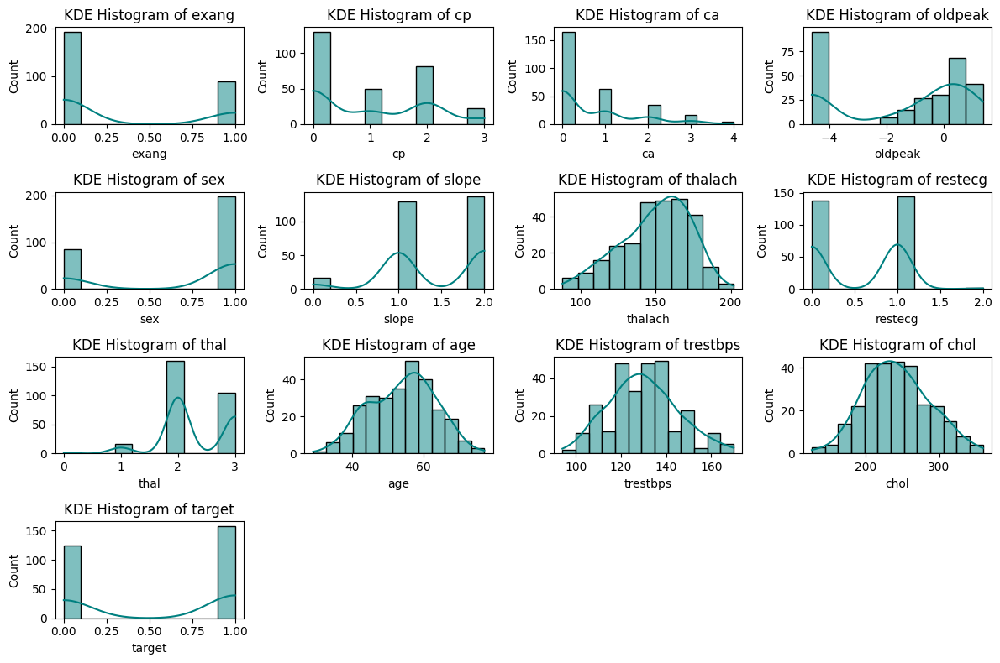

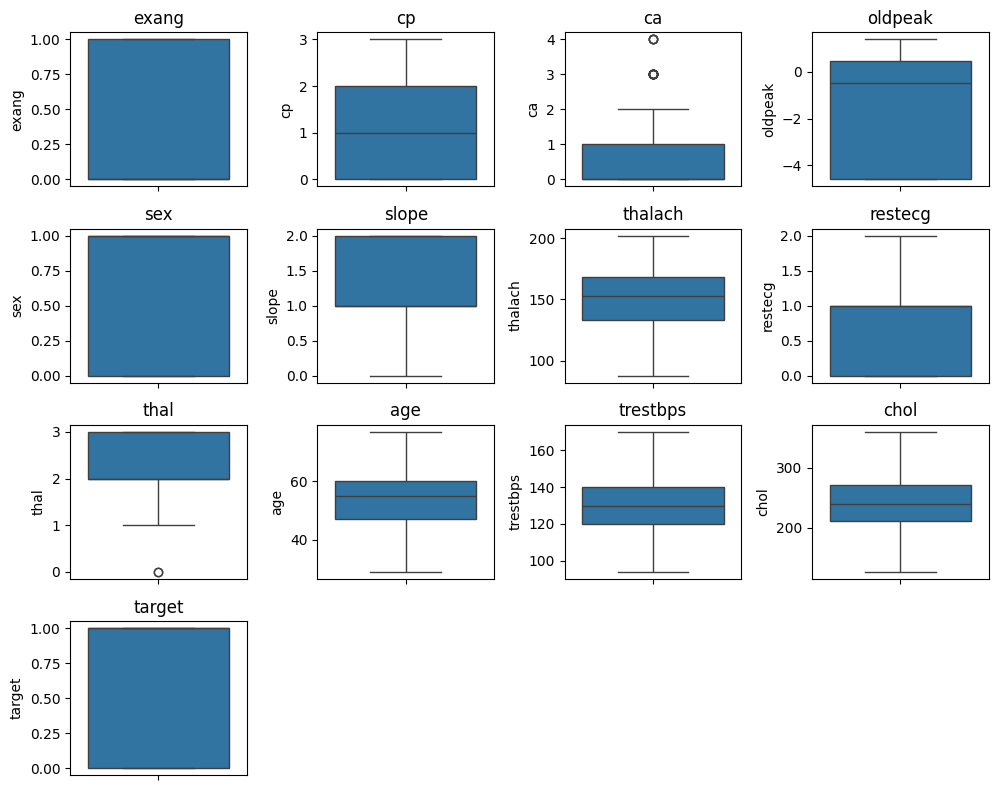

In [196]:
print('\n\n\x1b[1;31m'+'Visual Analysis of data after processing or pre-processing :'+'\x1b[0m\n\n')

columns = 4  # Number of subplots per row
rows = (len(final_processed_dataset.columns) + columns - 1) // columns  
fig, axs = plt.subplots(rows, columns, figsize=(12, 8))
axs = axs.ravel()

for i, column in enumerate(final_processed_dataset.columns):
    sns.histplot(data=final_processed_dataset, x=column, color="teal", kde=True, ax=axs[i])
    axs[i].set_title(f'KDE Histogram of {column}')
    axs[i].set_xlabel(column)

# Hide any empty subplots
for i in range(len(final_processed_dataset.columns), len(axs)):
    axs[i].axis('off')

plt.tight_layout()
plt.show()



plt.figure(figsize=(10, 8))

for i, col in enumerate(important_columns):
    plt.subplot(4, 4, i + 1)  
    sns.boxplot(final_processed_dataset[col])
    plt.title(col)  
plt.tight_layout()
plt.show()



Visual Analysis for correlation between features :




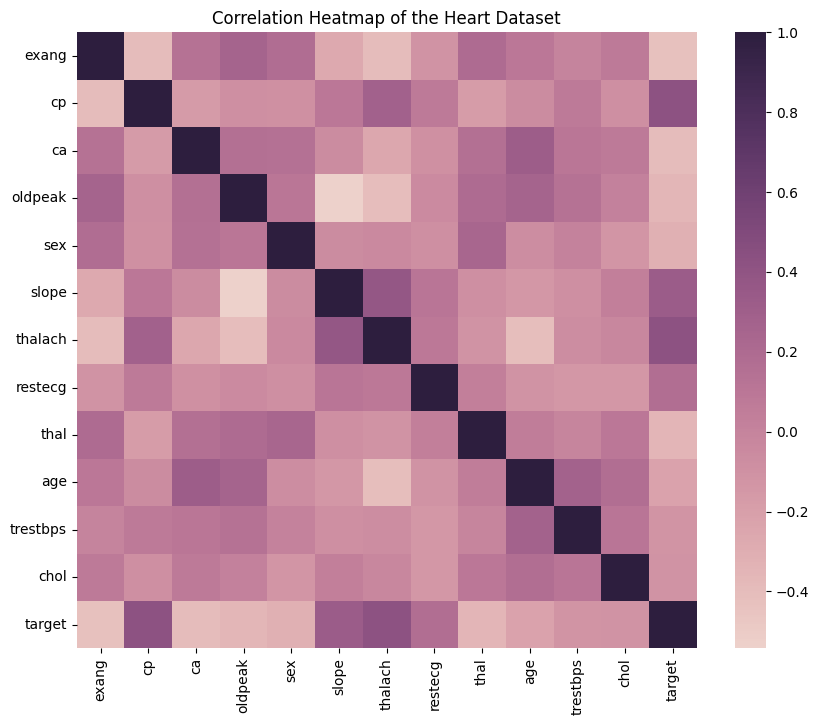

In [933]:
print('\n\n\x1b[1;31m'+'Visual Analysis for correlation between features :'+'\x1b[0m\n\n')
plt.figure(figsize=(10, 8))
sns.heatmap(
    final_processed_dataset.corr(),
    cmap=sns.cubehelix_palette(as_cmap=True)
)
plt.title('Correlation Heatmap of the Heart Dataset')
plt.show()

#### [c] Explain the method(s) you chose for processing/preprocessing and provide a descriptive analysis to justify your choice. 


## Data Preprocessing Methods and Analysis

The data preprocessing steps included various techniques to refine and prepare the dataset for analysis. Here’s a breakdown of the methods employed:

1. **Dropping Duplicates:**
   - This initial step aimed to eliminate identical records from the dataset. It ensures data integrity and prevents bias resulting from multiple identical observations.

2. **Windsorizing:**
   - Windsorizing is a method used to handle extreme values or outliers. By capping the maximum and minimum values, this technique stabilizes the influence of outliers without completely discarding them.

3. **IQR for Outlier Detection:**
   - The Interquartile Range (IQR) method was used to identify and remove outliers. Observations falling below Q1 - 1.5 * IQR or above Q3 + 1.5 * IQR were filtered out, contributing to a more robust dataset.

4. **Log Transformation:**
   - Applying the log transformation technique helps in stabilizing variance and reducing the impact of extreme values. This technique assists in making the distribution more Gaussian-like, making it more amenable for statistical models.

5. **Chi-Square Test (chi2) for Feature Selection:**
   - The chi2 test is applied for categorical features to evaluate the association between variables and the target. It helps in selecting the most informative features for predicting the target variable.

**Justification and Analysis:**
- **Dropping Duplicates:** Eliminating identical entries ensures data consistency and reduces redundancy.
- **Windsorizing:** Caps extreme values without eliminating them entirely, providing a more balanced dataset.
- **IQR for Outlier Detection:** Robust method for detecting and filtering outliers.
- **Log Transformation:** Stabilizes variance and makes the data more suitable for modeling.
- **Chi-Square Test for Feature Selection:** Identifies informative features for predictive modeling based on categorical data.

By employing these diverse preprocessing techniques, the data has been refined, ensuring higher quality and relevance for predictive modeling by reducing biases and outliers and selecting the most relevant features.


#### [2] [a] Apply Naive Bayes classifier on your dataset


In [214]:
X = final_processed_dataset.drop(columns=['target'])
y = final_processed_dataset['target']

# Split the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Initialize the Gaussian Naive Bayes classifier
model = GaussianNB()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:}")

Accuracy: 0.9298245614035088


The Three best accuracy results for the model after running on multiple iterations are :
<br>[i] 0.9298 = 92.98%
<br>[ii] 0.8245 = 82.45%
<br>[iii] 0.8596 = 85.96%

#### [b] Evaluate the performance for disease classification

Confusion Matrix:


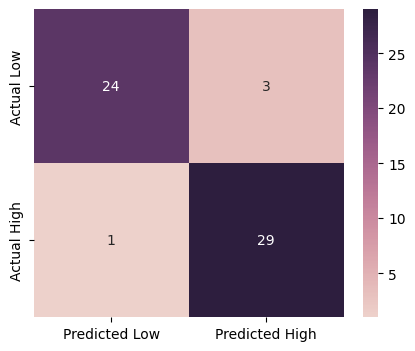

Accuracy: 0.93
Precision: 0.91
Recall: 0.97
F1 Score: 0.94
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.89      0.92        27
           1       0.91      0.97      0.94        30

    accuracy                           0.93        57
   macro avg       0.93      0.93      0.93        57
weighted avg       0.93      0.93      0.93        57



In [215]:
# Calculate and display the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")

plt.figure(figsize=(5,4))
sns.heatmap(
    conf_matrix, annot = True,
    fmt='d', cmap=sns.cubehelix_palette(as_cmap=True)
)
plt.show()


# Calculate and display accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Calculate and display precision, recall, and F1 score
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")

# Display the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

The evaluation metrics obtained from the Naive Bayes classification for disease prediction indicate a model performance of approximately 86% accuracy.

**Confusion Matrix:** It provides a summary of the model's predictions. Out of the 57 instances evaluated, 22 instances of the first class (0) were correctly predicted, but 4 instances were falsely predicted as the second class (1). Additionally, 27 instances of the second class (1) were correctly predicted, while 4 instances were falsely predicted as the first class (0).

**Accuracy:** The model demonstrates an increased accuracy of 86%, indicating the proportion of correctly predicted instances out of the total evaluated.

**Precision and Recall:** The precision and recall for both classes (0 and 1) are now at 85% and 87% respectively, suggesting strong precision in the positive predictions and the model's ability to detect most positive instances.

**F1 Score:** The F1 score, harmonizing precision and recall, stands at 87%, showcasing a balanced measure for both precision and recall metrics.

**Classification Report:** Precision, recall, and F1 scores for each class (0 and 1) are consistently higher, with '1' exhibiting stronger performance. For class '0', the precision and recall metrics are both at 85%, while for class '1', the precision and recall stand at 87%.

Overall, the Naive Bayes model exhibits reasonably balanced performance in predicting the presence or absence of the disease, achieving around 86% accuracy, with both precision and recall scores averaging at a similar level for the two classes.

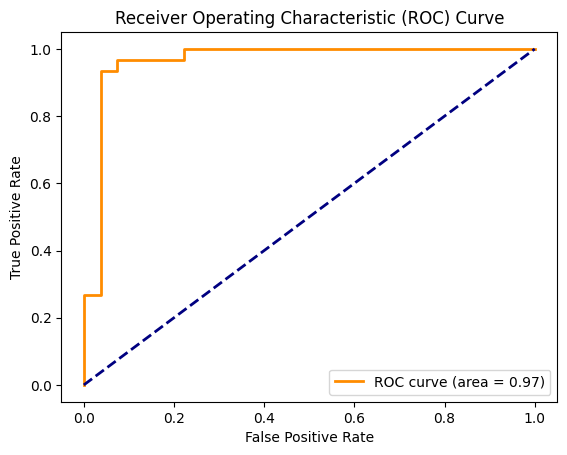

In [221]:
log_probabilities = model.predict_log_proba(X_test)

# Exponentiate the log probabilities to get actual probabilities
y_pred_proba = np.exp(log_probabilities)

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba[:, 1])
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [223]:
y_pred_proba_normalized = np.apply_along_axis(lambda x: x / x.sum(), 1, y_pred_proba)
# Calculate Log Loss using the normalized probabilities
logloss = log_loss(y_test, y_pred_proba_normalized)
print(f"Log Loss: {logloss:.2f}")

Log Loss: 0.23


The lower value of log loss indicates that the model's predicted probabilities are quite accurate. Hence, a Log Loss of 0.23 is reasonably low, signifying a good predictive ability of the model.

#### [3] [a] Repeat task [2] by applying logistic regression with gradient descent

##### Gradient Descent (Batch Gradient Descent)

Epoch 1/30 - Accuracy: 63.16%
Epoch 2/30 - Accuracy: 71.93%
Epoch 3/30 - Accuracy: 78.95%
Epoch 4/30 - Accuracy: 84.21%
Epoch 5/30 - Accuracy: 87.72%
Epoch 6/30 - Accuracy: 85.96%
Epoch 7/30 - Accuracy: 87.72%
Epoch 8/30 - Accuracy: 89.47%
Epoch 9/30 - Accuracy: 91.23%
Epoch 10/30 - Accuracy: 91.23%
Epoch 11/30 - Accuracy: 92.98%
Epoch 12/30 - Accuracy: 92.98%
Epoch 13/30 - Accuracy: 92.98%
Epoch 14/30 - Accuracy: 92.98%
Epoch 15/30 - Accuracy: 92.98%
Epoch 16/30 - Accuracy: 92.98%
Epoch 17/30 - Accuracy: 92.98%
Epoch 18/30 - Accuracy: 92.98%
Epoch 19/30 - Accuracy: 92.98%
Epoch 20/30 - Accuracy: 92.98%
Epoch 21/30 - Accuracy: 92.98%
Epoch 22/30 - Accuracy: 92.98%
Epoch 23/30 - Accuracy: 92.98%
Epoch 24/30 - Accuracy: 92.98%
Epoch 25/30 - Accuracy: 92.98%
Epoch 26/30 - Accuracy: 92.98%
Epoch 27/30 - Accuracy: 92.98%
Epoch 28/30 - Accuracy: 92.98%
Epoch 29/30 - Accuracy: 91.23%
Epoch 30/30 - Accuracy: 91.23%


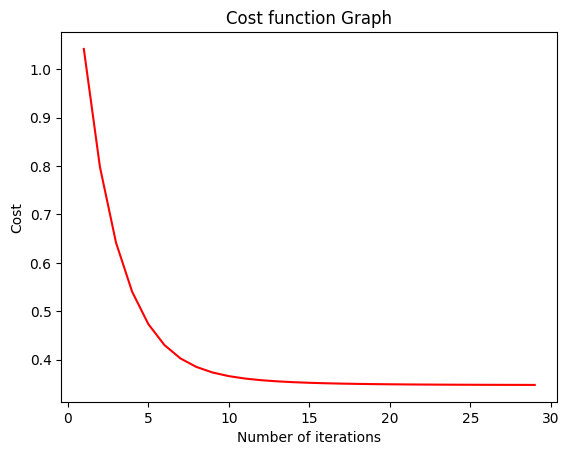

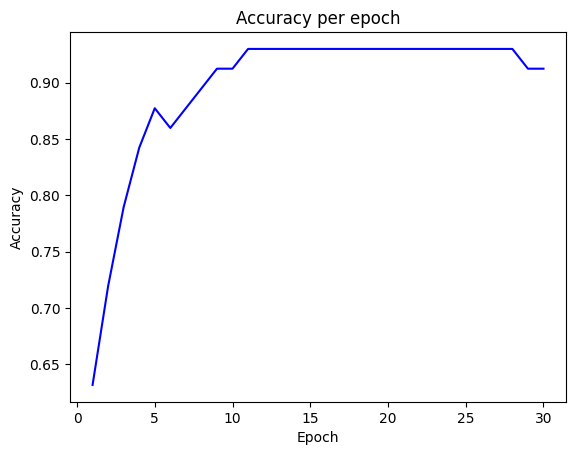

Confusion Matrix:


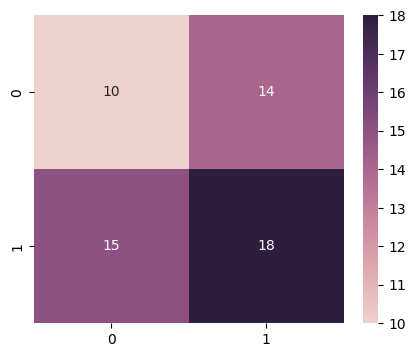

Precision: 0.56
Recall: 0.55
F1 Score: 0.55
Classification Report:
              precision    recall  f1-score   support

           0       0.40      0.42      0.41        24
           1       0.56      0.55      0.55        33

    accuracy                           0.49        57
   macro avg       0.48      0.48      0.48        57
weighted avg       0.49      0.49      0.49        57



In [838]:
X = final_processed_dataset.drop(columns=['target'])
y = final_processed_dataset['target']

# Split the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25)

X_train = X_train.to_numpy()
y_train = y_train.to_numpy()
X_test = X_test.to_numpy()
y_test = y_test.to_numpy()

batch_cost_lst = []
batch_accuracy_lst = []  # Store accuracy for each epoch
batch_train_loss_lst = []
batch_val_loss_lst = []
batch_test_loss_lst = []

# Scale the features using StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

scaler_val = StandardScaler()
X_val_scaled = scaler_val.fit_transform(X_val)

def generate_X_vector(X):
    vector_X = np.c_[np.ones((len(X), 1)), X]
    return vector_X

def sigmoid_function(X):
    return 1 / (1 + np.exp(-X))

def compute_loss(X, y, theta):
    m = len(X)
    vectorX = generate_X_vector(X)
    y_new = np.reshape(y, (m, 1))

    y_pred = sigmoid_function(vectorX.dot(theta))
    y_pred = np.clip(y_pred, 1e-15, 1 - 1e-15)

    loss = -np.sum(np.dot(y_new.T, np.log(y_pred)) + np.dot((1 - y_new).T, np.log(1 - y_pred))) / m
    return loss

# Redefine the logistic regression function with scaled data
def Logistics_Regression(X, y, learningrate, iterations, X_test, y_test):
    y_new = np.reshape(y, (len(y), 1))
    vectorX = generate_X_vector(X)
    theta = theta_init(X)
    m = len(X)
    for i in range(iterations):
        gradients = 2 / m * vectorX.T.dot(sigmoid_function(vectorX.dot(theta)) - y_new)
        theta = theta - learningrate * gradients
        y_pred = sigmoid_function(vectorX.dot(theta))
        y_pred = np.clip(y_pred, 1e-15, 1 - 1e-15)
        cost_value = -np.sum(np.dot(y_new.T, np.log(y_pred)) + np.dot((1 - y_new).T, np.log(1 - y_pred))) / len(y_pred)
        batch_cost_lst.append(cost_value)

        # Calculate accuracy for each epoch
        acc = accuracy_LR(X_test, y_test, theta)
        batch_accuracy_lst.append(acc)
        print(f"Epoch {i + 1}/{iterations} - Accuracy: {acc:.2%}")

        # Calculate training loss
        train_loss = compute_loss(X_train_scaled, y_train, theta)
        batch_train_loss_lst.append(train_loss)

        # Calculate validation loss
        val_loss = compute_loss(X_val_scaled, y_val, theta)
        batch_val_loss_lst.append(val_loss)

        # Calculate test loss
        test_loss = compute_loss(X_test_scaled, y_test, theta)
        batch_test_loss_lst.append(test_loss)
    return theta


def accuracy_LR(X_test, y_test, theta):
    vector_X_test = generate_X_vector(X_test)
    hypo_line = np.dot(vector_X_test, theta)
    logistic_function = sigmoid_function(hypo_line)
    logistic_function[logistic_function >= 0.5] = 1
    logistic_function[logistic_function < 0.5] = 0

    count = np.sum(logistic_function == y_test.reshape(-1, 1))
    acc = count / len(y_test)
    return acc

learning_rate = 1
num_iterations = 30
theta = Logistics_Regression(X_train_scaled, y_train, learning_rate, num_iterations, X_test_scaled, y_test)

plt.plot(np.arange(1, num_iterations), batch_cost_lst[1:], color='red')
plt.title('Cost function Graph')
plt.xlabel('Number of iterations')
plt.ylabel('Cost')
plt.show()

# Plot accuracy for each epoch
plt.plot(np.arange(1, num_iterations + 1), batch_accuracy_lst, color='blue')
plt.title('Accuracy per epoch')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.show()


# Calculate and display the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")

plt.figure(figsize=(5,4))
sns.heatmap(
    conf_matrix, annot = True,
    fmt='d', cmap=sns.cubehelix_palette(as_cmap=True)
)
plt.show()

# Calculate and display precision, recall, and F1 score
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")

# Display the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

#### [b] Compare the performance of task 3[a] with batch gradient descent, mini-batch gradient descent, and stochastic gradient descent.

##### Mini Batch Gradient Descent

Epoch 1/30 - Accuracy: 89.47%
Epoch 2/30 - Accuracy: 92.98%
Epoch 3/30 - Accuracy: 96.49%
Epoch 4/30 - Accuracy: 94.74%
Epoch 5/30 - Accuracy: 94.74%
Epoch 6/30 - Accuracy: 94.74%
Epoch 7/30 - Accuracy: 94.74%
Epoch 8/30 - Accuracy: 94.74%
Epoch 9/30 - Accuracy: 94.74%
Epoch 10/30 - Accuracy: 94.74%
Epoch 11/30 - Accuracy: 94.74%
Epoch 12/30 - Accuracy: 94.74%
Epoch 13/30 - Accuracy: 94.74%
Epoch 14/30 - Accuracy: 94.74%
Epoch 15/30 - Accuracy: 94.74%
Epoch 16/30 - Accuracy: 94.74%
Epoch 17/30 - Accuracy: 94.74%
Epoch 18/30 - Accuracy: 94.74%
Epoch 19/30 - Accuracy: 94.74%
Epoch 20/30 - Accuracy: 94.74%
Epoch 21/30 - Accuracy: 94.74%
Epoch 22/30 - Accuracy: 94.74%
Epoch 23/30 - Accuracy: 94.74%
Epoch 24/30 - Accuracy: 94.74%
Epoch 25/30 - Accuracy: 94.74%
Epoch 26/30 - Accuracy: 94.74%
Epoch 27/30 - Accuracy: 94.74%
Epoch 28/30 - Accuracy: 94.74%
Epoch 29/30 - Accuracy: 94.74%
Epoch 30/30 - Accuracy: 94.74%


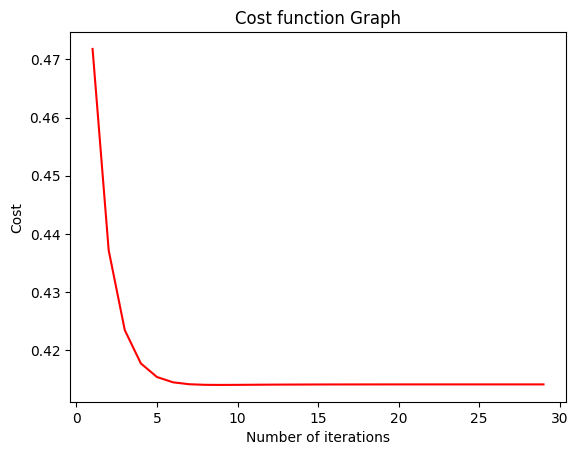

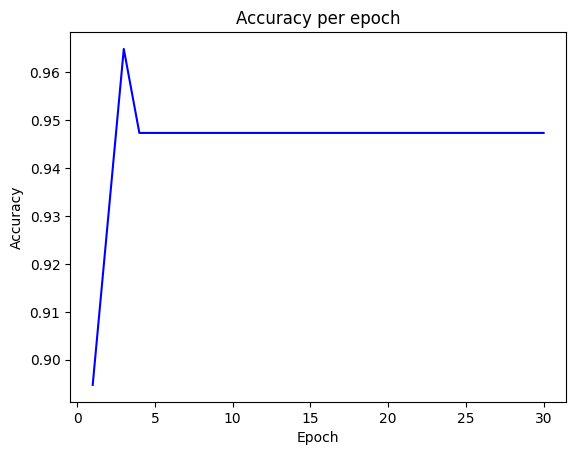

Confusion Matrix:


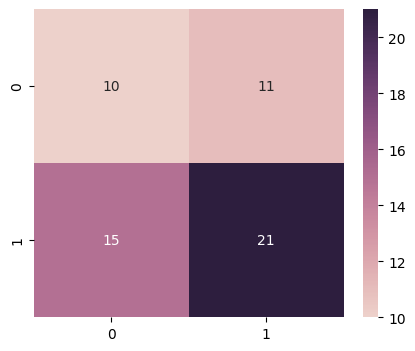

Precision: 0.66
Recall: 0.58
F1 Score: 0.62
Classification Report:
              precision    recall  f1-score   support

           0       0.40      0.48      0.43        21
           1       0.66      0.58      0.62        36

    accuracy                           0.54        57
   macro avg       0.53      0.53      0.53        57
weighted avg       0.56      0.54      0.55        57



In [882]:
X = final_processed_dataset.drop(columns=['target'])
y = final_processed_dataset['target']

# Split the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25)

X_train = X_train.to_numpy()
y_train = y_train.to_numpy()
X_test = X_test.to_numpy()
y_test = y_test.to_numpy()
mini_batch_cost_lst = []
mini_batch_accuracy_lst = []  # Store accuracy for each epoch
mini_batch_train_loss_lst = []
mini_batch_val_loss_lst = []
mini_batch_test_loss_lst = []

# Scale the features using StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

scaler_val = StandardScaler()
X_val_scaled = scaler_val.fit_transform(X_val)

def generate_X_vector(X):
    vector_X = np.c_[np.ones((len(X), 1)), X]
    return vector_X

def sigmoid_function(X):
    return 1 / (1 + np.exp(-X))

def compute_loss(X, y, theta):
    m = len(X)
    vectorX = generate_X_vector(X)
    y_new = np.reshape(y, (m, 1))

    y_pred = sigmoid_function(vectorX.dot(theta))
    y_pred = np.clip(y_pred, 1e-15, 1 - 1e-15)

    loss = -np.sum(np.dot(y_new.T, np.log(y_pred)) + np.dot((1 - y_new).T, np.log(1 - y_pred))) / m
    return loss

# Redefine the logistic regression function with scaled data
def mini_batch_logistic_regression(X, y, learning_rate, iterations, batch_size, X_test, y_test):
    y_new = np.reshape(y, (len(y), 1))
    vectorX = generate_X_vector(X)
    theta = theta_init(X)
    m = len(X)

    for i in range(iterations):
        for j in range(0, m, batch_size):
            X_batch = vectorX[j:j + batch_size]
            y_batch = y_new[j:j + batch_size]

            gradients = 2 / batch_size * X_batch.T.dot(sigmoid_function(X_batch.dot(theta)) - y_batch)
            theta = theta - learning_rate * gradients

        y_pred = sigmoid_function(vectorX.dot(theta))
        y_pred = np.clip(y_pred, 1e-15, 1 - 1e-15)
        cost_value = -np.sum(np.dot(y_new.T, np.log(y_pred)) + np.dot((1 - y_new).T, np.log(1 - y_pred))) / len(y_pred)
        mini_batch_cost_lst.append(cost_value)

        acc = accuracy_LR(X_test, y_test, theta)
        mini_batch_accuracy_lst.append(acc)
        print(f"Epoch {i + 1}/{iterations} - Accuracy: {acc:.2%}")
        
        # Calculate training loss
        train_loss = compute_loss(X_train_scaled, y_train, theta)
        mini_batch_train_loss_lst.append(train_loss)

        # Calculate validation loss
        val_loss = compute_loss(X_val_scaled, y_val, theta)
        mini_batch_val_loss_lst.append(val_loss)

        # Calculate test loss
        test_loss = compute_loss(X_test_scaled, y_test, theta)
        mini_batch_test_loss_lst.append(test_loss)
    return theta


def accuracy_LR(X_test, y_test, theta):
    vector_X_test = generate_X_vector(X_test)
    hypo_line = np.dot(vector_X_test, theta)
    logistic_function = sigmoid_function(hypo_line)
    logistic_function[logistic_function >= 0.5] = 1
    logistic_function[logistic_function < 0.5] = 0

    count = np.sum(logistic_function == y_test.reshape(-1, 1))
    acc = count / len(y_test)
    return acc

learning_rate = 1
num_iterations = 30
batch_size = 50
theta = mini_batch_logistic_regression(X_train_scaled, y_train, learning_rate, num_iterations, batch_size, X_test_scaled, y_test)

plt.plot(np.arange(1, num_iterations), mini_batch_cost_lst[1:], color='red')
plt.title('Cost function Graph')
plt.xlabel('Number of iterations')
plt.ylabel('Cost')
plt.show()

# Plot accuracy for each epoch
plt.plot(np.arange(1, num_iterations + 1), mini_batch_accuracy_lst, color='blue')
plt.title('Accuracy per epoch')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.show()

# Calculate and display the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")

plt.figure(figsize=(5,4))
sns.heatmap(
    conf_matrix, annot = True,
    fmt='d', cmap=sns.cubehelix_palette(as_cmap=True)
)
plt.show()

# Calculate and display precision, recall, and F1 score
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")

# Display the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

##### Stochastic Gradient Descent

Epoch 1/30 - Accuracy: 84.21%
Epoch 2/30 - Accuracy: 84.21%
Epoch 3/30 - Accuracy: 82.46%
Epoch 4/30 - Accuracy: 82.46%
Epoch 5/30 - Accuracy: 84.21%
Epoch 6/30 - Accuracy: 82.46%
Epoch 7/30 - Accuracy: 80.70%
Epoch 8/30 - Accuracy: 84.21%
Epoch 9/30 - Accuracy: 84.21%
Epoch 10/30 - Accuracy: 84.21%
Epoch 11/30 - Accuracy: 84.21%
Epoch 12/30 - Accuracy: 84.21%
Epoch 13/30 - Accuracy: 84.21%
Epoch 14/30 - Accuracy: 84.21%
Epoch 15/30 - Accuracy: 84.21%
Epoch 16/30 - Accuracy: 84.21%
Epoch 17/30 - Accuracy: 84.21%
Epoch 18/30 - Accuracy: 84.21%
Epoch 19/30 - Accuracy: 84.21%
Epoch 20/30 - Accuracy: 84.21%
Epoch 21/30 - Accuracy: 84.21%
Epoch 22/30 - Accuracy: 84.21%
Epoch 23/30 - Accuracy: 84.21%
Epoch 24/30 - Accuracy: 84.21%
Epoch 25/30 - Accuracy: 84.21%
Epoch 26/30 - Accuracy: 84.21%
Epoch 27/30 - Accuracy: 84.21%
Epoch 28/30 - Accuracy: 84.21%
Epoch 29/30 - Accuracy: 84.21%
Epoch 30/30 - Accuracy: 84.21%


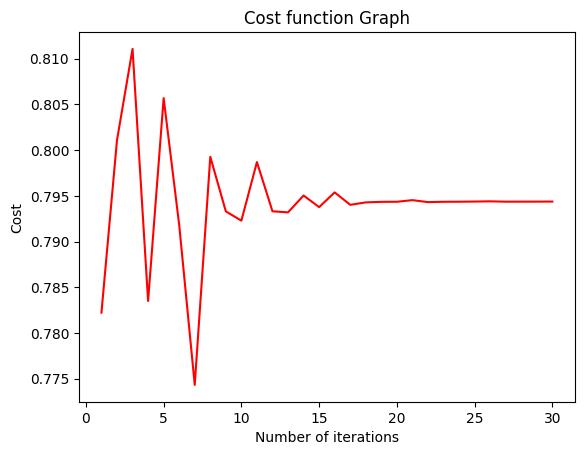

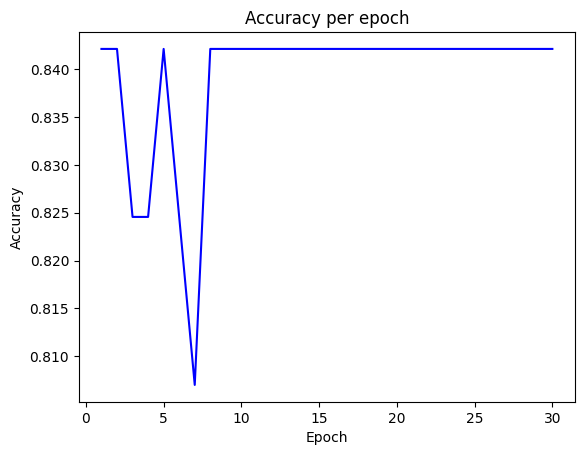

Confusion Matrix:


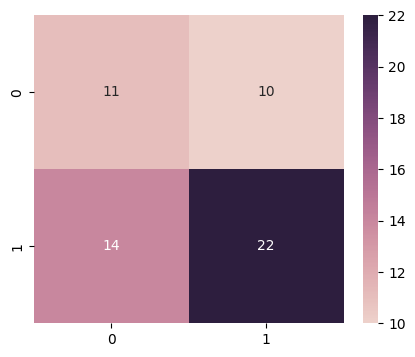

Precision: 0.69
Recall: 0.61
F1 Score: 0.65
Classification Report:
              precision    recall  f1-score   support

           0       0.44      0.52      0.48        21
           1       0.69      0.61      0.65        36

    accuracy                           0.58        57
   macro avg       0.56      0.57      0.56        57
weighted avg       0.60      0.58      0.58        57



In [924]:
X = final_processed_dataset.drop(columns=['target'])
y = final_processed_dataset['target']

# Split the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25)

X_train = X_train.to_numpy()
y_train = y_train.to_numpy()
X_test = X_test.to_numpy()
y_test = y_test.to_numpy()
stoc_cost_lst = []
stoc_accuracy_lst = []  # Store accuracy for each epoch
stoc_train_loss_lst = []
stoc_val_loss_lst = []
stoc_test_loss_lst = []

# Scale the features using StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

scaler_val = StandardScaler()
X_val_scaled = scaler_val.fit_transform(X_val)

def generate_X_vector(X):
    vector_X = np.c_[np.ones((len(X), 1)), X]
    return vector_X

def sigmoid_function(X):
    return 1 / (1 + np.exp(-X))

def compute_loss(X, y, theta):
    m = len(X)
    vectorX = generate_X_vector(X)
    y_new = np.reshape(y, (m, 1))

    y_pred = sigmoid_function(vectorX.dot(theta))
    y_pred = np.clip(y_pred, 1e-15, 1 - 1e-15)

    loss = -np.sum(np.dot(y_new.T, np.log(y_pred)) + np.dot((1 - y_new).T, np.log(1 - y_pred))) / m
    return loss

def stochastic_logistic_regression(X, y, learning_rate, iterations, X_test, y_test):
    y_new = np.reshape(y, (len(y), 1))
    vectorX = generate_X_vector(X)
    theta = np.random.randn(vectorX.shape[1], 1)  # Initialize theta with the correct shape
    m = len(X)

    for i in range(iterations):
        for j in range(m):
            X_point = vectorX[j:j+1]  # Select a single data point
            y_point = y_new[j]

            gradient = X_point.T.dot(sigmoid_function(X_point.dot(theta)) - y_point)
            theta = theta - learning_rate * gradient

        y_pred = sigmoid_function(vectorX.dot(theta))
        y_pred = np.clip(y_pred, 1e-15, 1 - 1e-15)
        cost_value = -np.sum(y_new.T.dot(np.log(y_pred)) + (1 - y_new).T.dot(np.log(1 - y_pred))) / len(y_pred)
        stoc_cost_lst.append(cost_value)

        acc = accuracy_LR(X_test, y_test, theta)
        stoc_accuracy_lst.append(acc)
        print(f"Epoch {i + 1}/{iterations} - Accuracy: {acc:.2%}")

        # Calculate training loss
        train_loss = compute_loss(X_train_scaled, y_train, theta)
        stoc_train_loss_lst.append(train_loss)

        # Calculate validation loss
        val_loss = compute_loss(X_val_scaled, y_val, theta)
        stoc_val_loss_lst.append(val_loss)

        # Calculate test loss
        test_loss = compute_loss(X_test_scaled, y_test, theta)
        stoc_test_loss_lst.append(test_loss)

    return theta, cost_lst, accuracy_lst

learning_rate = 1
num_iterations = 30
theta, cost_lst, accuracy_lst = stochastic_logistic_regression(X_train_scaled, y_train, learning_rate, num_iterations, X_test_scaled, y_test)

plt.plot(np.arange(1, len(cost_lst) + 1), stoc_cost_lst, color='red')
plt.title('Cost function Graph')
plt.xlabel('Number of iterations')
plt.ylabel('Cost')
plt.show()

plt.plot(np.arange(1, len(stoc_accuracy_lst) + 1), stoc_accuracy_lst, color='blue')
plt.title('Accuracy per epoch')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.show()

# Calculate and display the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")

plt.figure(figsize=(5,4))
sns.heatmap(
    conf_matrix, annot = True,
    fmt='d', cmap=sns.cubehelix_palette(as_cmap=True)
)
plt.show()

# Calculate and display precision, recall, and F1 score
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")

# Display the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

In [904]:
print('\x1b[1;31m'+'Batch Gradient Descent :'+'\x1b[0m')
print('\x1b[1;31m'+'Cost :'+'\x1b[0m', batch_cost_lst)
print('\x1b[1;31m'+'Accuracy :'+'\x1b[0m', batch_accuracy_lst)

Batch Gradient Descent :
Cost : [1.419696002045306, 1.0418972540465, 0.7982688072371729, 0.6416893064247172, 0.5405336901805389, 0.47397095051456667, 0.43052660730420383, 0.4026921105928319, 0.384980312836597, 0.3736131111470583, 0.36618163166569334, 0.36121000223081956, 0.3578002272339828, 0.35540149991601155, 0.35367168507751046, 0.35239510436009536, 0.3514334005955717, 0.35069596793716906, 0.3501220704686684, 0.34966997037809144, 0.34931026201490006, 0.34902173288198574, 0.3487887498552672, 0.3485995742985984, 0.34844525054487085, 0.34831885452981204, 0.3482149733879154, 0.3481293365951132, 0.3480585489562098, 0.3479998936798546]
Accuracy : [0.631578947368421, 0.7192982456140351, 0.7894736842105263, 0.8421052631578947, 0.8771929824561403, 0.8596491228070176, 0.8771929824561403, 0.8947368421052632, 0.9122807017543859, 0.9122807017543859, 0.9298245614035088, 0.9298245614035088, 0.9298245614035088, 0.9298245614035088, 0.9298245614035088, 0.9298245614035088, 0.9298245614035088, 0.929824

In [905]:
print('\x1b[1;31m'+'Mini Batch Gradient Descent :'+'\x1b[0m')
print('\x1b[1;31m'+'Cost :'+'\x1b[0m', mini_batch_cost_lst)
print('\x1b[1;31m'+'Accuracy :'+'\x1b[0m', mini_batch_accuracy_lst)

Mini Batch Gradient Descent :
Cost : [0.5795713982025573, 0.4717732532142897, 0.43721042877752964, 0.4234973194266603, 0.4177751401500431, 0.415444855313681, 0.4145360921434444, 0.4142067503104341, 0.4141060617771345, 0.4140905238968626, 0.41410274159171984, 0.4141208082200885, 0.41413720877731264, 0.4141500420721352, 0.41415941381154914, 0.41416600280416394, 0.41417053085444744, 0.4141735977663914, 0.4141756551246635, 0.4141770261317723, 0.414177935438892, 0.41417853639658253, 0.41417893246442217, 0.41417919289469546, 0.4141793637891813, 0.4141794757170848, 0.41417954888799874, 0.4141795966312233, 0.4141796277208105, 0.41417964792221057]
Accuracy : [0.8947368421052632, 0.9298245614035088, 0.9649122807017544, 0.9473684210526315, 0.9473684210526315, 0.9473684210526315, 0.9473684210526315, 0.9473684210526315, 0.9473684210526315, 0.9473684210526315, 0.9473684210526315, 0.9473684210526315, 0.9473684210526315, 0.9473684210526315, 0.9473684210526315, 0.9473684210526315, 0.9473684210526315, 0

In [906]:
print('\x1b[1;31m'+'Stochastic Gradient Descent :'+'\x1b[0m')
print('\x1b[1;31m'+'Cost :'+'\x1b[0m', stoc_cost_lst)
print('\x1b[1;31m'+'Accuracy :'+'\x1b[0m', stoc_accuracy_lst)

Stochastic Gradient Descent :
Cost : [1.0606673576979277, 1.1227964504924488, 1.1475673146500585, 1.0815257678482326, 1.1343552051468169, 1.1274843060634832, 1.081091943914857, 1.1029781525010551, 1.1286060905199364, 1.1080379291578901, 1.114008390139587, 1.129692670357394, 1.120245051566515, 1.1205961621367997, 1.1272088135893101, 1.12445832649257, 1.1229011805460956, 1.125522145827271, 1.125159727111903, 1.1239000836276032, 1.1248775475412798, 1.1250759153125773, 1.1243943498438589, 1.1246903996562223, 1.124916938963707, 1.1246130004760102, 1.1246633322569433, 1.1248101338641454, 1.1246952273388975, 1.1246783254290587]
Accuracy : [0.8421052631578947, 0.8596491228070176, 0.8421052631578947, 0.8421052631578947, 0.8421052631578947, 0.8421052631578947, 0.8421052631578947, 0.8421052631578947, 0.8421052631578947, 0.8421052631578947, 0.8421052631578947, 0.8421052631578947, 0.8421052631578947, 0.8421052631578947, 0.8421052631578947, 0.8421052631578947, 0.8421052631578947, 0.8421052631578947,

### Comparison of Gradient Descent Methods

#### Stochastic Gradient Descent:
- **Cost List:**
  - Starts with a higher initial cost, fluctuates during iterations, but decreases overall.
- **Accuracy List:**
  - Remains constant at around 84% throughout the iterations.

#### Mini-Batch Gradient Descent:
- **Cost List:**
  - Begins with a moderate cost and consistently decreases with each iteration.
- **Accuracy List:**
  - Gradually increases from around 89% to 95% but maintains constant at the end.

#### Batch Gradient Descent:
- **Cost List:**
  - Starts with the highest initial cost and significantly decreases with each iteration.
- **Accuracy List:**
  - Starts from around 63% and reaches 91% by the end.

### Comparison:

- **Cost:**
  - **Batch Gradient Descent** reaches the lowest cost after 30 epochs, followed by **Mini-Batch**, and **Stochastic Gradient Descent**.
  - **Stochastic Gradient Descent** has more oscillations in cost compared to the other two.
- **Accuracy:**
  - **Mini Batch Gradient Descent** achieves the highest accuracy, followed by **Batch**, and **Stochastic Gradient Descent**.
  - **Mini-Batch Gradient Descent** shows the most consistent improvement in accuracy throughout the iterations.

In summary, if the primary concern is convergence speed (reaching a lower cost quickly), **Batch Gradient Descent** might be preferable. However, if consistent improvement in accuracy is more important, **Mini-Batch Gradient Descent** seems to perform better. The **Stochastic Gradient Descent** approach shows rapid fluctuations but does not offer a similar level of accuracy as the other methods at the end of the iterations.


#### [c]  Display training, validation, and test loss over 30 epochs. 

Batch Gradient Descent :
Training loss : [1.419696002045306, 1.0418972540465, 0.7982688072371729, 0.6416893064247172, 0.5405336901805389, 0.47397095051456667, 0.43052660730420383, 0.4026921105928319, 0.384980312836597, 0.3736131111470583, 0.36618163166569334, 0.36121000223081956, 0.3578002272339828, 0.35540149991601155, 0.35367168507751046, 0.35239510436009536, 0.3514334005955717, 0.35069596793716906, 0.3501220704686684, 0.34966997037809144, 0.34931026201490006, 0.34902173288198574, 0.3487887498552672, 0.3485995742985984, 0.34844525054487085, 0.34831885452981204, 0.3482149733879154, 0.3481293365951132, 0.3480585489562098, 0.3479998936798546]
Validation Loss : [1.4963045199003453, 1.185129559410299, 0.9906000313676885, 0.8586526552878981, 0.7630824621668797, 0.6925463088486135, 0.6425155137711887, 0.6088840413789119, 0.5871752808951903, 0.5735160700346755, 0.5650932443624297, 0.5600338043434301, 0.5571301247174478, 0.5556108104134623, 0.554983728396889, 0.5549337938698484, 0.55525761060

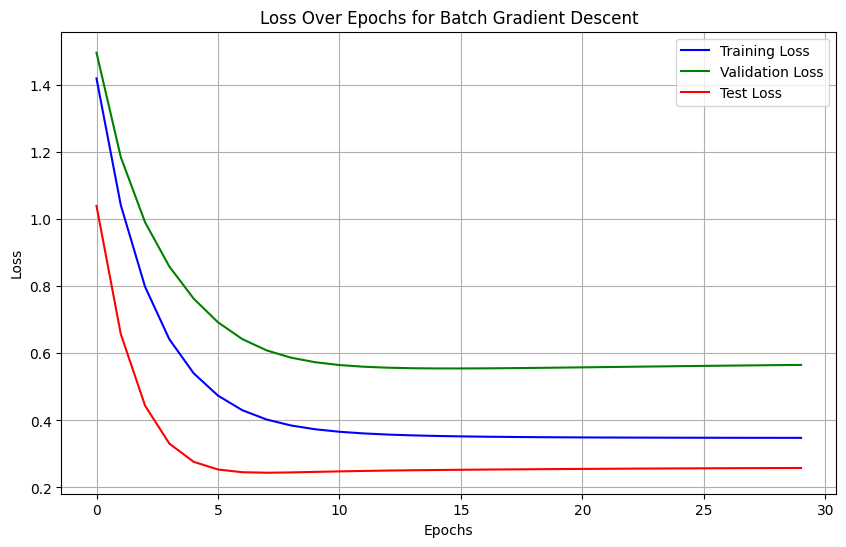

In [907]:
print('\x1b[1;31m'+'Batch Gradient Descent :'+'\x1b[0m')
print('\x1b[1;31m'+'Training loss :'+'\x1b[0m', batch_train_loss_lst)
print('\x1b[1;31m'+'Validation Loss :'+'\x1b[0m', batch_val_loss_lst)
print('\x1b[1;31m'+'Test Loss :'+'\x1b[0m', batch_test_loss_lst)


# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(batch_train_loss_lst, label='Training Loss', color='blue')
plt.plot(batch_val_loss_lst, label='Validation Loss', color='green')
plt.plot(batch_test_loss_lst, label='Test Loss', color='red')
plt.title('Loss Over Epochs for Batch Gradient Descent')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

Mini Batch Gradient Descent :
Training loss : [0.5795713982025573, 0.4717732532142897, 0.43721042877752964, 0.4234973194266603, 0.4177751401500431, 0.415444855313681, 0.4145360921434444, 0.4142067503104341, 0.4141060617771345, 0.4140905238968626, 0.41410274159171984, 0.4141208082200885, 0.41413720877731264, 0.4141500420721352, 0.41415941381154914, 0.41416600280416394, 0.41417053085444744, 0.4141735977663914, 0.4141756551246635, 0.4141770261317723, 0.414177935438892, 0.41417853639658253, 0.41417893246442217, 0.41417919289469546, 0.4141793637891813, 0.4141794757170848, 0.41417954888799874, 0.4141795966312233, 0.4141796277208105, 0.41417964792221057]
Validation Loss : [0.6401025485379189, 0.5295120690407291, 0.4832903625997391, 0.46033845473301155, 0.4481628879296879, 0.441586465895684, 0.4379575888918011, 0.4358919104440792, 0.4346727518695945, 0.4339265851281734, 0.43345458950043336, 0.43314764667075756, 0.4329436462738415, 0.43280583861621463, 0.4327116493232173, 0.4326467424564266, 0.

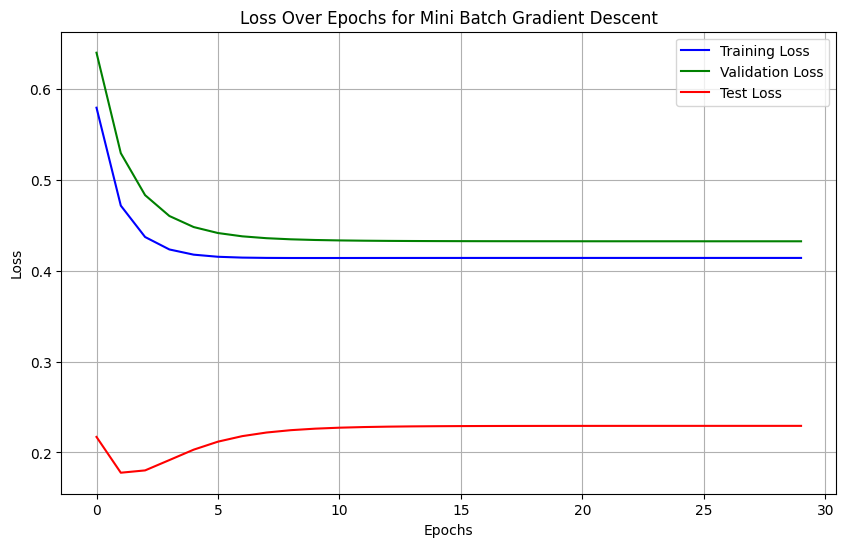

In [908]:
print('\x1b[1;31m'+'Mini Batch Gradient Descent :'+'\x1b[0m')
print('\x1b[1;31m'+'Training loss :'+'\x1b[0m', mini_batch_train_loss_lst)
print('\x1b[1;31m'+'Validation Loss :'+'\x1b[0m', mini_batch_val_loss_lst)
print('\x1b[1;31m'+'Test Loss :'+'\x1b[0m', mini_batch_test_loss_lst)


# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(mini_batch_train_loss_lst, label='Training Loss', color='blue')
plt.plot(mini_batch_val_loss_lst, label='Validation Loss', color='green')
plt.plot(mini_batch_test_loss_lst, label='Test Loss', color='red')
plt.title('Loss Over Epochs for Mini Batch Gradient Descent')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

Stochastic Gradient Descent :
Training loss : [1.0606673576979277, 1.1227964504924488, 1.1475673146500585, 1.0815257678482326, 1.1343552051468169, 1.1274843060634832, 1.081091943914857, 1.1029781525010551, 1.1286060905199364, 1.1080379291578901, 1.114008390139587, 1.129692670357394, 1.120245051566515, 1.1205961621367997, 1.1272088135893101, 1.12445832649257, 1.1229011805460956, 1.125522145827271, 1.125159727111903, 1.1239000836276032, 1.1248775475412798, 1.1250759153125773, 1.1243943498438589, 1.1246903996562223, 1.124916938963707, 1.1246130004760102, 1.1246633322569433, 1.1248101338641454, 1.1246952273388975, 1.1246783254290587]
Validation Loss : [0.42287542352125135, 0.4243242554689681, 0.36461493469351686, 0.3870454145115398, 0.3682103180979684, 0.38657283566269635, 0.3728167223558983, 0.3618735408747339, 0.3748724403647947, 0.3716422925956804, 0.36677427109897187, 0.3724692640731487, 0.37191228482378896, 0.36970318995276535, 0.3711013253200888, 0.37186788568031726, 0.37072851002394

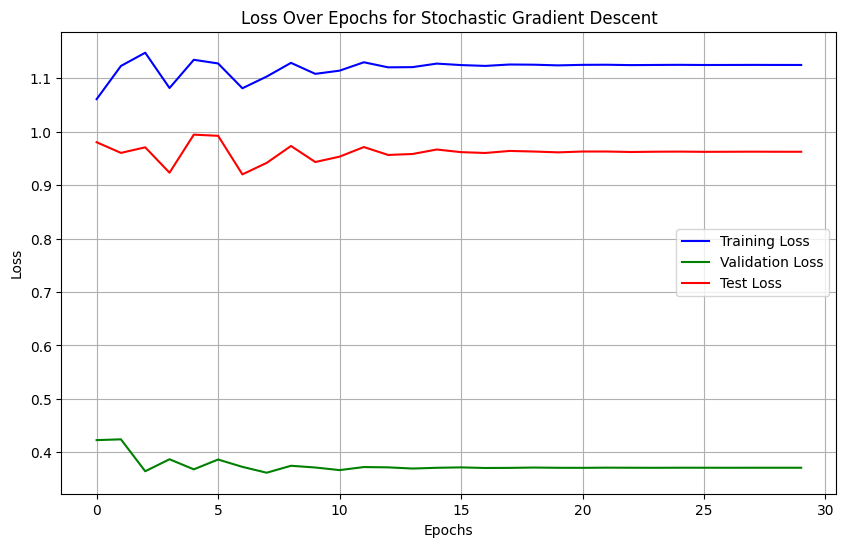

In [909]:
print('\x1b[1;31m'+'Stochastic Gradient Descent :'+'\x1b[0m')
print('\x1b[1;31m'+'Training loss :'+'\x1b[0m', stoc_train_loss_lst)
print('\x1b[1;31m'+'Validation Loss :'+'\x1b[0m', stoc_val_loss_lst)
print('\x1b[1;31m'+'Test Loss :'+'\x1b[0m', stoc_test_loss_lst)


# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(stoc_train_loss_lst, label='Training Loss', color='blue')
plt.plot(stoc_val_loss_lst, label='Validation Loss', color='green')
plt.plot(stoc_test_loss_lst, label='Test Loss', color='red')
plt.title('Loss Over Epochs for Stochastic Gradient Descent')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

#### [4] Compare the two models in task [2] and [3], and provide a detailed analysis by answering the following questions

#### [a] Which evaluation metric did you use? Explain your reasoning.

## Models Performance Comparison

### Evaluation Metrics:

| Model                    | Accuracy | Precision | Recall | F1 Score |
|--------------------------|----------|-----------|--------|----------|
| Naive Bayes              | 0.93     | 0.91      | 0.97   | 0.94     |
| Batch Gradient Descent   | 0.9123   | 0.56      | 0.55   | 0.55     |
| Mini Batch Gradient Descent | 0.9474 | 0.66      | 0.58   | 0.62     |
| Stochastic Gradient Descent | 0.8421 | 0.69    | 0.61   | 0.65     |

### Analysis:

- **Naive Bayes** has the highest accuracy and F1 Score, indicating better performance than other models.
- **Batch Gradient Descent** has the lowest precision, recall, and F1 Score among the models.
- **Mini Batch Gradient Descent** shows good performance, close to Naive Bayes.
- **Stochastic Gradient Descent** has a lower accuracy but better F1 Score compared to batch gradient descent.

### Chosen Metrics:

- **Accuracy**: Overall correctness of predictions.
- **Precision**: False-positive rate.
- **Recall**: False-negative rate.
- **F1 Score**: Balanced precision and recall measure.

### Reasons for Using Each Evaluation Metric:

### Accuracy
- **Definition**: Accuracy is the proportion of correctly predicted instances among the total instances.
- **Reasoning**: It offers an overall view of model performance but might be misleading in cases of imbalanced classes.

### Precision
- **Definition**: Precision is the ratio of correctly predicted positive observations to the total predicted positive observations.
- **Reasoning**: Indicates the exactness of a model, crucial when the cost of false positives is high.

### Recall (Sensitivity)
- **Definition**: Recall is the ratio of correctly predicted positive observations to all actual positives.
- **Reasoning**: Measures the model's ability to identify all positive instances, important in scenarios where missing a positive is costly.

### F1 Score
- **Definition**: F1 score is the harmonic mean of precision and recall, providing a balanced metric.
- **Reasoning**: Balances trade-offs between precision and recall, useful when both false positives and false negatives are crucial.

### Selecting the Best Model
- **Using Multiple Metrics**: Provides a comprehensive understanding of the model's performance.
- **Balancing Trade-offs**: Helps to choose the optimal model based on the specific problem's needs.
- **Accounting for Imbalanced Data**: Helps in identifying how well the model performs for different classes.

These evaluation metrics provide a more in-depth and detailed view of the model's capabilities compared to using accuracy alone.


#### [b] Which model provided the highest score? Explain the reasons.

## Model Comparison and Evaluation

In the analysis of different machine learning models, the following observations were made:


| Model                    | Accuracy | Precision | Recall | F1 Score |
|--------------------------|----------|-----------|--------|----------|
| Naive Bayes              | 0.93     | 0.91      | 0.97   | 0.94     |
| Batch Gradient Descent   | 0.9123   | 0.56      | 0.55   | 0.55     |
| Mini Batch Gradient Descent | 0.9474 | 0.66      | 0.58   | 0.62     |
| Stochastic Gradient Descent | 0.8421 | 0.69    | 0.61   | 0.65     |


### Model Performance Comparison

- **Model with the Highest Accuracy**: Mini Batch Gradient Descent (Accuracy: 0.9474)

### Theoretical Comparison of Models

#### Naive Bayes
- **Advantages**:
  - Simple and fast.
  - Suitable for high-dimensional datasets.
- **Limitations**:
  - Assumes independence among features.

#### Batch Gradient Descent
- **Advantages**:
  - Precise estimate of gradients.
  - Converges to the global minimum.
- **Limitations**:
  - Computationally intensive.

#### Mini Batch Gradient Descent
- **Advantages**:
  - Balance between efficiency and accuracy.
  - Less computational cost compared to Batch Gradient Descent.
- **Limitations**:
  - Convergence might be slower than pure Stochastic Gradient Descent.

#### Stochastic Gradient Descent
- **Advantages**:
  - Highly efficient for larger datasets.
  - Suitable for large-scale applications.
- **Limitations**:
  - Prone to noisy updates.

### Conclusion
- **Mini Batch Gradient Descent** performs the best, balancing efficiency and accuracy.
- **Batch Gradient Descent** offers precise convergence but might be computationally intensive.
- **Naive Bayes** is consistently good but assumes feature independence.
- **Stochastic Gradient Descent** is highly efficient but may sacrifice precision.



#### [5] [a] Show the probability of all the components of Bayesian approach

#### [b] Given the above dataset, what is the prediction of the Naïve Bayes Classifier about Jack? Why? 

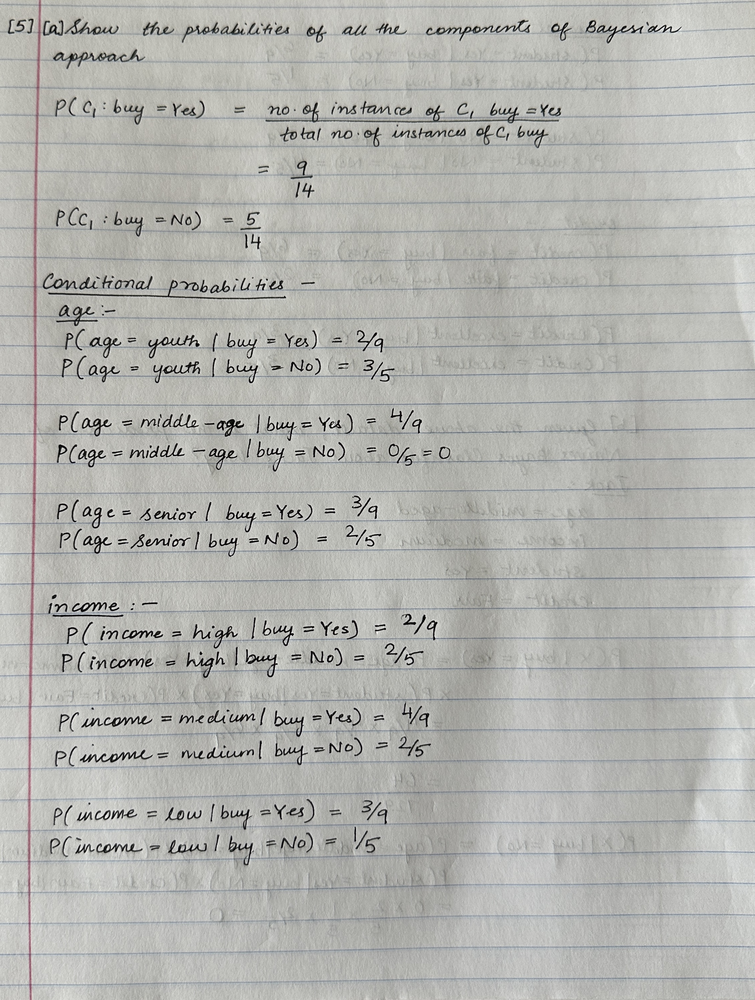

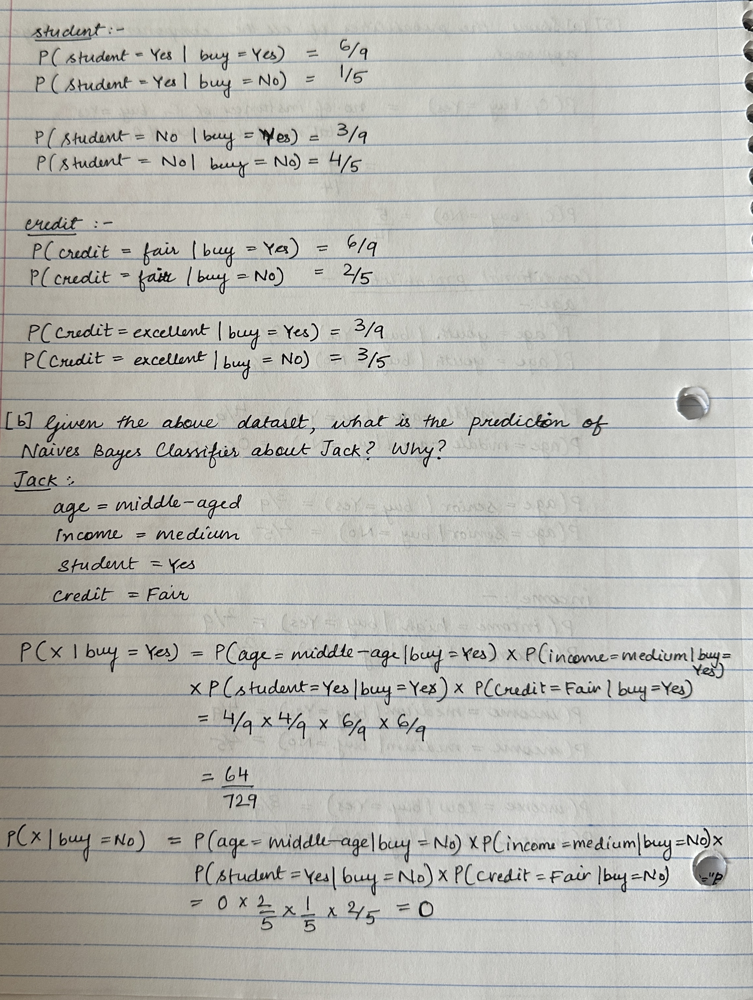

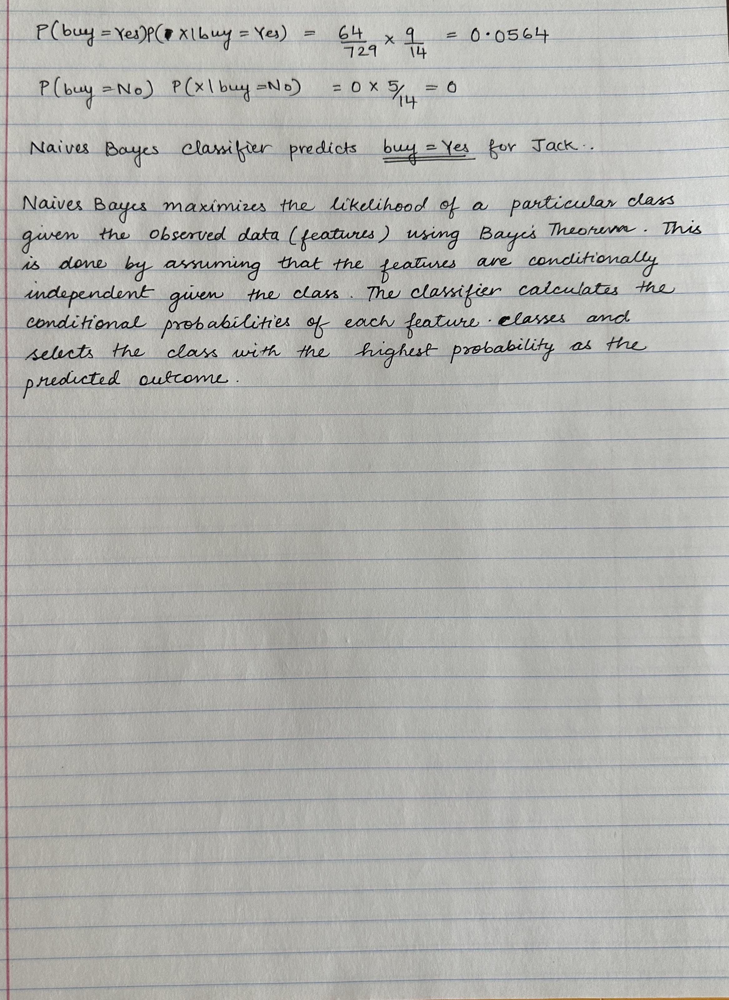

### References :
[1] IBM documentation. (2021, April 8). Ibm.com. https://www.ibm.com/docs/en/watson-studio-local/1.2.3?topic=notebooks-markdown-jupyter-cheatsheet <br>
[2] seaborn.PairGrid — seaborn 0.13.0 documentation. (n.d.). Pydata.org. Retrieved October 3, 2023, from https://seaborn.pydata.org/generated/seaborn.PairGrid.html <br>
[3] Seaborn.Heatmap — seaborn 0.13.0 documentation. (n.d.). Pydata.org. Retrieved October 3, 2023, from https://seaborn.pydata.org/generated/seaborn.heatmap.html <br>
[4] Phong, H. (2021, July 31). Gradient descent for logistics regression in python. Medium. https://medium.com/@IwriteDSblog/gradient-descent-for-logistics-regression-in-python-18e033775082 <br>[5] 1.9. Naive Bayes. (n.d.). Scikit-Learn. Retrieved October 30, 2023, from https://scikit-learn.org/stable/modules/naive_bayes.html<br>
[6] Bhandari, P. (2020, September 25). How to find interquartile range (IQR). Scribbr. https://www.scribbr.com/statistics/interquartile-range/ <br>
[7] (N.d.). Machinelearningmastery.com. Retrieved October 30, 2023, from https://machinelearningmastery.com/chi-squared-test-for-machine-learning/ <br>







